In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import pathlib
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns
import re
import shutil
import pandas as pd
import scipy.stats

import exdir
import expipe
from distutils.dir_util import copy_tree
import septum_mec
import spatial_maps as sp
import head_direction.head as head
import septum_mec.analysis.data_processing as dp
import septum_mec.analysis.registration
from septum_mec.analysis.plotting import violinplot, despine
from spatial_maps.fields import (
    find_peaks, calculate_field_centers, separate_fields_by_laplace, 
    map_pass_to_unit_circle, calculate_field_centers, distance_to_edge_function, 
    which_field, compute_crossings)
from phase_precession import cl_corr
from spike_statistics.core import permutation_resampling
import matplotlib.mlab as mlab
import scipy.signal as ss
from scipy.interpolate import interp1d
from septum_mec.analysis.plotting import regplot
from skimage import measure
from tqdm.notebook import tqdm_notebook as tqdm
tqdm.pandas()

from pandarallel import pandarallel
pandarallel.initialize(progress_bar=False)

19:33:57 [I] klustakwik KlustaKwik2 version 0.2.6
/home/mikkel/.virtualenvs/expipe/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/home/mikkel/.virtualenvs/expipe/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/home/mikkel/.virtualenvs/expipe/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


INFO: Pandarallel will run on 8 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


In [3]:
# %matplotlib notebook
%matplotlib inline

In [4]:
project_path = dp.project_path()
project = expipe.get_project(project_path)
actions = project.actions

output_path = pathlib.Path("output") / "phase-precession"
(output_path / "statistics").mkdir(exist_ok=True, parents=True)
(output_path / "figures").mkdir(exist_ok=True, parents=True)

# Load cell statistics and shuffling quantiles

In [5]:
statistics_action = actions['calculate-statistics']
identification_action = actions['identify-neurons']
sessions = pd.read_csv(identification_action.data_path('sessions'))
units = pd.read_csv(identification_action.data_path('units'))
session_units = pd.merge(sessions, units, on='action')
statistics_results = pd.read_csv(statistics_action.data_path('results'))
statistics = pd.merge(session_units, statistics_results, how='left')
statistics.head()

,action,baseline,entity,frequency,i,ii,session,stim_location,stimulated,tag,...,burst_event_ratio,bursty_spike_ratio,gridness,border_score,information_rate,information_specificity,head_mean_ang,head_mean_vec_len,spacing,orientation
0,1849-060319-3,True,1849,NaN,False,True,3,NaN,False,baseline ii,...,0.398230,0.678064,-0.466923,0.029328,1.009215,0.317256,5.438033,0.040874,0.628784,20.224859
1,1849-060319-3,True,1849,NaN,False,True,3,NaN,False,baseline ii,...,0.138014,0.263173,-0.666792,0.308146,0.192524,0.033447,1.951740,0.017289,0.789388,27.897271
2,1849-060319-3,True,1849,NaN,False,True,3,NaN,False,baseline ii,...,0.373986,0.659259,-0.572566,0.143252,4.745836,0.393704,4.439721,0.124731,0.555402,28.810794
3,1849-060319-3,True,1849,NaN,False,True,3,NaN,False,baseline ii,...,0.087413,0.179245,-0.437492,0.268948,0.157394,0.073553,6.215195,0.101911,0.492250,9.462322
4,1849-060319-3,True,1849,NaN,False,True,3,NaN,False,baseline ii,...,0.248771,0.463596,-0.085938,0.218744,0.519153,0.032683,1.531481,0.053810,0.559905,0.000000


In [6]:
statistics['unit_day'] = statistics.apply(lambda x: str(x.unit_idnum) + '_' + x.action.split('-')[1], axis=1)

In [7]:
stim_response_action = actions['stimulus-response']
stim_response_results = pd.read_csv(stim_response_action.data_path('results'))

In [8]:
statistics = pd.merge(statistics, stim_response_results, how='left')

In [9]:
print('N cells:',statistics.shape[0])

N cells: 1284


In [10]:
shuffling = actions['shuffling']
quantiles_95 = pd.read_csv(shuffling.data_path('quantiles_95'))
quantiles_95.head()

,border_score,gridness,head_mean_ang,head_mean_vec_len,information_rate,speed_score,action,channel_group,unit_name
0,0.348023,0.275109,3.012689,0.086792,0.707197,0.149071,1833-010719-1,0.0,127.0
1,0.362380,0.166475,3.133138,0.037271,0.482486,0.132212,1833-010719-1,0.0,161.0
2,0.367498,0.266865,5.586395,0.182843,0.271188,0.062821,1833-010719-1,0.0,191.0
3,0.331942,0.312155,5.955767,0.090786,0.354018,0.052009,1833-010719-1,0.0,223.0
4,0.325842,0.180495,5.262721,0.103584,0.210427,0.094041,1833-010719-1,0.0,225.0


In [11]:
action_columns = ['action', 'channel_group', 'unit_name']
all_data = pd.merge(statistics, quantiles_95, on=action_columns, suffixes=("", "_threshold"))

all_data['specificity'] = np.log10(all_data['in_field_mean_rate'] / all_data['out_field_mean_rate'])

all_data.head()

,action,baseline,entity,frequency,i,ii,session,stim_location,stimulated,tag,...,p_e_peak,t_i_peak,p_i_peak,border_score_threshold,gridness_threshold,head_mean_ang_threshold,head_mean_vec_len_threshold,information_rate_threshold,speed_score_threshold,specificity
0,1849-060319-3,True,1849,NaN,False,True,3,NaN,False,baseline ii,...,NaN,NaN,NaN,0.332548,0.229073,6.029431,0.205362,1.115825,0.066736,0.451741
1,1849-060319-3,True,1849,NaN,False,True,3,NaN,False,baseline ii,...,NaN,NaN,NaN,0.354830,0.089333,6.120055,0.073566,0.223237,0.052594,0.098517
2,1849-060319-3,True,1849,NaN,False,True,3,NaN,False,baseline ii,...,NaN,NaN,NaN,0.264610,-0.121081,5.759406,0.150827,4.964984,0.027120,0.400770
3,1849-060319-3,True,1849,NaN,False,True,3,NaN,False,baseline ii,...,NaN,NaN,NaN,0.344280,0.215829,6.033364,0.110495,0.239996,0.054074,0.269461
4,1849-060319-3,True,1849,NaN,False,True,3,NaN,False,baseline ii,...,NaN,NaN,NaN,0.342799,0.218967,5.768170,0.054762,0.524990,0.144702,0.133410


# Statistics about all cell-sessions

In [12]:
all_data.groupby('stimulated').count()['action']

stimulated
False    624
True     660
Name: action, dtype: int64

# Find all cells with gridness above threshold

In [13]:
query = (
    'gridness > gridness_threshold and '
    'information_rate > information_rate_threshold and '
    'gridness > .2 and '
    'average_rate < 25'
)
sessions_above_threshold = all_data.query(query)
print("Number of sessions above threshold", len(sessions_above_threshold))
print("Number of animals", len(sessions_above_threshold.groupby(['entity'])))

Number of sessions above threshold 194
Number of animals 4


## select neurons that have been characterized as a grid cell on the same day

In [14]:
data = statistics[statistics.unit_day.isin(sessions_above_threshold.unit_day.values)]

In [15]:
print("Number of gridcells", data.unit_idnum.nunique())
print("Number of gridcell recordings", len(data))
print("Number of animals", len(data.groupby(['entity'])))

Number of gridcells 139
Number of gridcell recordings 231
Number of animals 4


# divide into stim not stim

In [16]:
data['group'] = np.nan

/home/mikkel/.virtualenvs/expipe/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [17]:
############################ Only true baseline (preceeding stim)  #############################
data.loc[data.eval('baseline and Hz11'), 'group'] = 'baseline_i'
data.loc[data.eval('stimulated and frequency==11 and stim_location=="ms"'), 'group'] = 'stim_11'

data.loc[data.eval('baseline and Hz30'), 'group'] = 'baseline_ii'
data.loc[data.eval('stimulated and frequency==30 and stim_location=="ms"'), 'group'] = 'stim_30'


################################## All baseline sessions #######################################
# data.loc[data.eval('baseline and i'), 'group'] = 'baseline_i'
# data.loc[data.eval('stimulated and frequency==11 and stim_location=="ms"'), 'group'] = 'stim_11'

# data.loc[data.eval('baseline and ii'), 'group'] = 'baseline_ii'
# data.loc[data.eval('stimulated and frequency==30 and stim_location=="ms"'), 'group'] = 'stim_30'

/home/mikkel/.virtualenvs/expipe/lib/python3.6/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [18]:
data.groupby('group').count().action

group
baseline_i     66
baseline_ii    56
stim_11        61
stim_30        40
Name: action, dtype: int64

In [19]:
# only look at cells that were present during baseline
# baseline_ids = baseline_i.unit_idnum.unique()
# stimulated_11_sub = stimulated_11[stimulated_11.unit_idnum.isin(baseline_ids)]
# baseline_ids_11 = stimulated_11_sub.unit_idnum.unique()
# baseline_i_sub = baseline_i[baseline_i.unit_idnum.isin(baseline_ids_11)]

# Plotting

In [20]:
max_speed = .5 # m/s only used for speed score
min_speed = 0.02 # m/s only used for speed score
position_sampling_rate = 100 # for interpolation
position_low_pass_frequency = 6 # for low pass filtering of position

box_size = [1.0, 1.0]
bin_size = 0.02
smoothing_low = 0.03
smoothing_high = 0.06

speed_binsize = 0.02

stim_mask = True
baseline_duration = 600

In [21]:
data_loader = dp.Data(
    position_sampling_rate=position_sampling_rate, 
    position_low_pass_frequency=position_low_pass_frequency,
    box_size=box_size, bin_size=bin_size, 
    stim_mask=stim_mask, baseline_duration=baseline_duration
)

In [22]:
from scipy.signal import butter, filtfilt

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a


def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = filtfilt(b, a, data)
    return y

In [23]:
def signaltonoise(a, axis=0, ddof=0):
    a = np.asanyarray(a)
    m = a.mean(axis)
    sd = a.std(axis=axis, ddof=ddof)
    return np.where(sd == 0, 0, m / sd)


def remove_artifacts(anas, spikes=None, width=500, threshold=2, sampling_rate=None, fillval=0):
    sampling_rate = sampling_rate or anas.sampling_rate.magnitude
    times = np.arange(anas.shape[0]) / sampling_rate
    anas = np.array(anas)
    if anas.ndim == 1:
        anas = np.reshape(anas, (anas.size, 1))
    assert len(times) == anas.shape[0]
    nchan = anas.shape[1]
    if spikes is not None:
        spikes = np.array(spikes)
    for ch in range(nchan):
        idxs, = np.where(abs(anas[:, ch]) > threshold)
        for idx in idxs:
            if spikes is not None:
                t0 = times[idx-width]
                stop = idx+width
                if stop > len(times) - 1:
                    stop = len(times) - 1 
                t1 = times[stop]
                mask = (spikes > t0) & (spikes < t1)
                spikes = spikes[~mask]
            anas[idx-width:idx+width, ch] = fillval
    if spikes is not None:
        spikes = spikes[spikes <= times[-1]]
        return anas, times, spikes
    else:
        return anas, times

In [24]:
def find_theta_peak(p, f, f1, f2):
    if np.all(np.isnan(p)):
        return np.nan, np.nan
    mask = (f > f1) & (f < f2)
    p_m = p[mask]
    f_m = f[mask]
    peaks = find_peaks(p_m)
    idx = np.argmax(p_m[peaks])
    return f_m[peaks[idx]], p_m[peaks[idx]]

In [25]:
def compute_spike_phase(lfp, times, return_degrees=False):
    x_a = ss.hilbert(lfp)
    x_phase = np.angle(x_a)
    if return_degrees:
        x_phase = x_phase * 180 / np.pi
    return interp1d(times, x_phase)

In [26]:
def find_grid_fields(rate_map, sigma=3, seed=2.5):
    # find fields with laplace
    fields_laplace = sp.fields.separate_fields_by_dilation(rate_map, sigma=sigma, seed=seed)
    fields = fields_laplace.copy() # to be cleaned by Ismakov
    fields_areas = scipy.ndimage.measurements.sum(
        np.ones_like(fields), fields, index=np.arange(fields.max() + 1))
    fields_area = fields_areas[fields]
    fields[fields_area < 9.0] = 0

    # find fields with Ismakov-method
    fields_ismakov, radius = sp.separate_fields_by_distance(rate_map)
    fields_ismakov_real = fields_ismakov * bin_size
    approved_fields = []

    # remove fields not found by both methods
    for point in fields_ismakov:
        field_id = fields[tuple(point)]
        approved_fields.append(field_id)

    for field_id in np.arange(1, fields.max() + 1):
        if not field_id in approved_fields:
            fields[fields == field_id] = 0
            
    return fields

In [27]:
def normalize(a):
    _a = a - a.min()
    return _a / _a.max()

In [28]:
def distance(x, y):
    _x = x - x.min()
    _y = y - y.min()
    dx, dy = np.diff(_x), np.diff(_y)
    s = np.sqrt(dx**2 + dy**2)
    distance = np.cumsum(s) 
    # first index is distance from first point, 
    # to match len(x) we put a zero as first index to initialize distance 0
    return np.concatenate(([0], distance))

In [29]:
def model(x, slope, phi0):
    return 2 * np.pi * slope * x + phi0

In [30]:
def inspect_lfp(row, flim=[6,10], threshold=2):
    lfp = data_loader.lfp(row.action, row.channel_group)
    spikes = data_loader.spike_train(row.action, row.channel_group, row.unit_name)
    cleaned_lfp_, times_ = remove_artifacts(lfp, threshold=threshold)
    peak_amp = {}
    for i, ch in enumerate(cleaned_lfp_.T):
        pxx, freqs = mlab.psd(ch, Fs=lfp.sampling_rate.magnitude, NFFT=4000)
        f, p = find_theta_peak(pxx, freqs, *flim)
        peak_amp[i] = p

    theta_channel = max(peak_amp, key=lambda x: peak_amp[x])
    
    cleaned_lfp, times, cleaned_spikes = remove_artifacts(
        lfp.magnitude[:,theta_channel], spikes, threshold=threshold, sampling_rate=lfp.sampling_rate.magnitude, fillval=0)
    cleaned_lfp = cleaned_lfp.ravel()
#     filtered_lfp = butter_bandpass_filter(
#         lfp.magnitude[:,theta_channel], *flim, fs=lfp.sampling_rate.magnitude, order=3)
    filtered_lfp = butter_bandpass_filter(
        cleaned_lfp, *flim, fs=lfp.sampling_rate.magnitude, order=3)
    
#     cleaned_lfp, times, cleaned_spikes = remove_artifacts(
#         filtered_lfp, spikes, threshold=threshold, sampling_rate=lfp.sampling_rate.magnitude, fillval=0)
    
    
    
    return cleaned_lfp, filtered_lfp, lfp.magnitude[:,theta_channel]

In [31]:
# cleaned_lfp, filtered_lfp, raw_lfp = inspect_lfp(data.query('action=="1833-260619-1" and unit_idnum==32').iloc[0])

In [32]:
# plt.plot(raw_lfp, label='raw')
# plt.plot(cleaned_lfp, label='cleaned')
# plt.plot(filtered_lfp, label='filtered')
# plt.legend()
# plt.xlim(36000, 42000)

In [33]:
# def compute_data(row, flim=[6,10], threshold=2):
#     lfp = data_loader.lfp(row.action, row.channel_group)
#     spikes = data_loader.spike_train(row.action, row.channel_group, row.unit_name)
#     rate_map = data_loader.rate_map(row.action, row.channel_group, row.unit_name, smoothing=0.04)
#     pos_x, pos_y, pos_t, pos_speed = map(data_loader.tracking(row.action).get, ['x', 'y', 't', 'v'])
#     sample_rate = lfp.sampling_rate.magnitude
    
#     # to select the best LFP channel
#     cleaned_lfp_, _ = remove_artifacts(lfp, threshold=threshold)
#     peak_amp = {}
#     for i, ch in enumerate(cleaned_lfp_.T):
#         pxx, freqs = mlab.psd(ch, Fs=sample_rate, NFFT=4000)
#         f, p = find_theta_peak(pxx, freqs, *flim)
#         peak_amp[i] = p
#     theta_channel = max(peak_amp, key=lambda x: peak_amp[x])
    
#     # sometimes the position is recorded after LFP recording is ended
#     times = np.arange(lfp.shape[0]) / sample_rate
#     idxs_to_remove, = np.where(pos_t > times[-1])
#     pos_x = np.delete(pos_x, idxs_to_remove)
#     pos_y = np.delete(pos_y, idxs_to_remove)
#     pos_t = np.delete(pos_t, idxs_to_remove)
    
    
#     filtered_lfp = butter_bandpass_filter(
#         lfp.magnitude[:,theta_channel], *flim, fs=sample_rate, order=3)

#     spike_phase_func = compute_spike_phase(filtered_lfp, times)
    
#     fields = find_grid_fields(rate_map, sigma=2.5, seed=2.5)
    
#     return spike_phase_func, spikes, pos_x, pos_y, pos_t, rate_map, fields

def compute_data(row, flim=[6,10]):
    lfp = data_loader.lfp(row.action, row.channel_group)
    spikes = data_loader.spike_train(row.action, row.channel_group, row.unit_name)
    rate_map = data_loader.rate_map(row.action, row.channel_group, row.unit_name, smoothing=0.04)
    pos_x, pos_y, pos_t, pos_speed = map(data_loader.tracking(row.action).get, ['x', 'y', 't', 'v'])
    
    sample_rate = lfp.sampling_rate.magnitude

    cleaned_lfp_, times_ = remove_artifacts(lfp)
    peak_amp = {}
    for i, ch in enumerate(cleaned_lfp_.T):
        pxx, freqs = mlab.psd(ch, Fs=sample_rate, NFFT=4000)
        f, p = find_theta_peak(pxx, freqs, *flim)
        peak_amp[i] = p

    theta_channel = max(peak_amp, key=lambda x: peak_amp[x])
    
    # sometimes the position is recorded after LFP recording is ended
    times = np.arange(lfp.shape[0]) / sample_rate
    
    idxs_to_remove, = np.where(pos_t > times[-1])
    pos_x = np.delete(pos_x, idxs_to_remove)
    pos_y = np.delete(pos_y, idxs_to_remove)
    pos_t = np.delete(pos_t, idxs_to_remove)
    
    spikes = np.array(spikes)
    spikes = spikes[(spikes > pos_t.min()) & (spikes < pos_t.max())]
    
    filtered_lfp = butter_bandpass_filter(
        lfp.magnitude[:,theta_channel], *flim, fs=sample_rate, order=3)
    
    # only relevant for 1849?
    cleaned_lfp, times, cleaned_spikes = remove_artifacts(
        filtered_lfp, spikes, threshold=2, sampling_rate=sample_rate, fillval=0)
    
    cleaned_lfp = cleaned_lfp.ravel()

    spike_phase_func = compute_spike_phase(cleaned_lfp, times)
    
    fields = find_grid_fields(rate_map, sigma=2.5, seed=2.5)
    
    return spike_phase_func, spikes, pos_x, pos_y, pos_t, rate_map, fields

In [34]:
def plot_spikes_and_rate_map(row, rate_map, fields, pos_x, pos_y, sy, sx, spikes, box_size, bin_size, dot_size, flim, output_path, save, axs):
    contours = measure.find_contours(fields, 0.8)

    # Display the image and plot all contours found
    axs[1][0].imshow(rate_map.T, extent=[0, box_size[0], 0, box_size[1]], origin='lower')
    axs[1][1].plot(pos_x, pos_y, color='k', alpha=.2, zorder=1000)
    axs[1][1].scatter(sx(spikes), sy(spikes), s=dot_size, zorder=10001)

    for ax in axs.ravel()[1:]:
        for n, contour in enumerate(contours):
            ax.plot(contour[:, 0] * bin_size, contour[:, 1] * bin_size, linewidth=2)

    for ax in axs.ravel()[1:]:
        ax.axis('image')
        ax.set_xticks([])
        ax.set_yticks([])
        
#         axs[0][0].set_aspect(1 / (4*np.pi))

    despine()
    if save:
        figname = f'{row.action}_{row.channel_group}_{row.unit_idnum}_f{flim[0]}-{flim[1]}'
        fig.savefig(
            output_path / 'figures' / f'{figname}.png', 
            bbox_inches='tight', transparent=True)
        fig.savefig(
            output_path / 'figures' / f'{figname}.svg', 
            bbox_inches='tight', transparent=True)
        
def plot_spike_phase(spike_dist, spike_phase, dot_size, slope, phi0, circ_lin_corr, pval, RR, plot_regression_line, ax):
    p = ax.scatter(spike_dist, spike_phase, s=dot_size)
    ax.scatter(
        spike_dist, spike_phase + 2 * np.pi, 
        s=dot_size, color=p.get_facecolor()[0])
    ax.set_yticks([-np.pi, np.pi, 3*np.pi])
    ax.set_yticklabels([r'$-\pi$', r'$\pi$', r'$3\pi$'])
    if plot_regression_line:
        line_fit = model(spike_dist, slope, phi0)
        ax.plot(spike_dist, line_fit, lw=2)
        ax.set_title(
            f'corr = {circ_lin_corr:.3f}, '
            f'pvalue = {pval:.3f}, '
            f'R = {RR:.3f}')
        
def compute_rate_crossings(spikes, times, threshold=0):
    from elephant.statistics import instantaneous_rate
    from elephant.kernels import GaussianKernel
    import quantities as pq
    import neo
    spikes = neo.SpikeTrain(spikes, t_stop=times[-1], units='s')
    
    kernel = GaussianKernel(100 * pq.ms)
    
    rate = instantaneous_rate(spikes, np.diff(times).min() * pq.s, kernel=kernel)
    
    rate = rate.magnitude
    mean = np.mean(rate)
    std = np.std(rate)
    indices = np.where(rate > mean + std * threshold)[0]
    
    field_indices = np.concatenate(([0], indices.astype(int), [0]))
    enter, = np.where(np.diff(field_indices) > 1)
    exit = enter[1:] - 1
    return rate, indices, indices[enter], indices[exit]

In [35]:
def compute_phase_precession_runs(row, flim=[6, 10], field_num=None, slope_limit_dist=[-1,1], slope_limit_dur=[-1,1], norm=False, store_runs=False,
                             plot=False, plot_regression_line=True, save=False, dot_size=1, crossing_type='field'):
    '''
    flim : [flow, fhigh]
    field_num : int
        which field to plot
    reg_limit : [low, high]
        Regression intervall
    plot : str
        "all" or "scatter"
    plot_regression_line : bool
        plot the regression line in scatter
    save : bool
        save plot
    dot_size : size of scatter dots
    '''
    if plot == 'all':
        fig, axs = plt.subplots(2, 2)
        plt.suptitle(f'{row.action} {row.channel_group} {row.unit_idnum}')
    elif plot == 'scatter':
        fig, ax = plt.subplots(1, 1)
        axs = [[ax]]
        ax.set_title(f'{row.action} {row.channel_group} {row.unit_idnum}')
        
    spike_phase_func, spikes, pos_x, pos_y, pos_t, rate_map, fields = compute_data(
        row, flim)
    
    if field_num is not None:
        fields = np.where(fields == field_num, fields, 0)
        
    if crossing_type == 'field':
        in_field_indices = which_field(pos_x, pos_y, fields, box_size)
        in_field_enter, in_field_exit = compute_crossings(in_field_indices)
    elif crossing_type == 'rate':
        _, _, in_field_enter, in_field_exit = compute_rate_crossings(spikes, pos_t)

    spikes = np.array(spikes)
    spikes = spikes[(spikes > pos_t.min()) & (spikes < pos_t.max())]

    sx, sy = interp1d(pos_t, pos_x), interp1d(pos_t, pos_y)
    results = []
    max_dist = 0
    for en, ex in zip(in_field_enter, in_field_exit):
        x, y, t = pos_x[en:ex+1], pos_y[en:ex+1], pos_t[en:ex+1]
        if len(t) <= 1:
            continue
        s = spikes[(spikes > t[0]) & (spikes < t[-1])]
        if len(s) < 5:
            continue

        spike_phase = spike_phase_func(s)
        
        dist = distance(x, y)
        if norm:
            t_to_dist = interp1d(t, normalize(dist))
        else:
            t_to_dist = interp1d(t, dist)
            
        spike_dist = t_to_dist(s)
        spike_dur = s - t[0]
        
        circ_lin_corr_dist, pval_dist, slope_dist, phi0_dist, RR_dist = cl_corr(
            spike_dist, spike_phase, *slope_limit_dist, return_pval=True)
        circ_lin_corr_dur, pval_dur, slope_dur, phi0_dur, RR_dur = cl_corr(
            spike_dur, spike_phase, *slope_limit_dur, return_pval=True)
        result_run = {
            'action': row.action, 
            'channel_group': row.channel_group, 
            'unit_name': row.unit_name,
            'group': row.group,
            'unit_idnum': row.unit_idnum,
            'slope_limit_dist': slope_limit_dist,
            'slope_limit_dur': slope_limit_dur,
            'flim': flim,
            'crossing_type': crossing_type,
            'norm': norm,
            'circ_lin_corr_dist': circ_lin_corr_dist, 
            'pval_dist': pval_dist, 
            'slope_dist': slope_dist, 
            'phi0_dist': phi0_dist, 
            'RR_dist': RR_dist,
            'circ_lin_corr_dur': circ_lin_corr_dur, 
            'pval_dur': pval_dur, 
            'slope_dur': slope_dur, 
            'phi0_dur': phi0_dur, 
            'RR_dur': RR_dur,
        }
        if store_runs:
            result_run.update({
                'spike_dist': spike_dist,
                'spike_dur': spike_dur,
                'spike_phase': spike_phase
            })
        results.append(result_run)
        if plot:
            plot_spike_phase(spike_dist, spike_phase, dot_size, slope_dist, phi0_dist, circ_lin_corr_dist, pval_dist, RR_dist, plot_regression_line, axs[0][0])
        
        if plot == 'all':
            axs[0][1].plot(x, y)
            axs[0][1].scatter(sx(s), sy(s), s=dot_size, color='r', zorder=100000)

    if plot == 'all':
        plot_spikes_and_rate_map(row, rate_map, fields, pos_x, pos_y, sy, sx, spikes, box_size, bin_size, dot_size, flim, output_path, save, axs)
    
    return results

In [36]:
plt.rc('axes', titlesize=12)
plt.rcParams.update({
    'font.size': 12, 
    'figure.figsize': (6, 6), 
    'figure.dpi': 150
})

/home/mikkel/.virtualenvs/expipe/lib/python3.6/site-packages/elephant/statistics.py:835: UserWarning: Instantaneous firing rate approximation contains negative values, possibly caused due to machine precision errors.
  warnings.warn("Instantaneous firing rate approximation contains "


,action,channel_group,unit_name,group,unit_idnum,slope_limit_dist,slope_limit_dur,flim,crossing_type,norm,...,phi0_dist,RR_dist,circ_lin_corr_dur,pval_dur,slope_dur,phi0_dur,RR_dur,spike_dist,spike_dur,spike_phase
0,1833-260619-1,0,132,baseline_i,32,"[-20, 20]","[-1, 1]","[6, 10]",rate,False,...,2.324287,0.901484,0.439716,0.221005,0.128608,2.587809,0.887255,"[0.012147135564937317, 0.051689127799828115, 0...","[0.07398418479672131, 0.23025085146338853, 0.2...","[2.1669906523701563, 2.2734681246324353, 2.983..."
1,1833-260619-1,0,132,baseline_i,32,"[-20, 20]","[-1, 1]","[6, 10]",rate,False,...,3.699880,0.659012,-0.268671,0.345601,-0.352090,3.794314,0.662260,"[0.05301367506893133, 0.05439567348034808, 0.0...","[0.1357508514633885, 0.13978418479672072, 0.24...","[-2.4129531006287763, -2.210072502444354, 2.90..."
2,1833-260619-1,0,132,baseline_i,32,"[-20, 20]","[-1, 1]","[6, 10]",rate,False,...,0.198597,0.460846,-0.009167,0.975249,-0.025049,2.644096,0.282645,"[0.04201839956773008, 0.07596736078388329, 0.0...","[0.10448418479671773, 0.1862508514633845, 0.20...","[2.989365397990702, 0.07763731206116431, 1.023..."
3,1833-260619-1,0,132,baseline_i,32,"[-20, 20]","[-1, 1]","[6, 10]",rate,False,...,5.399986,0.426899,0.048850,0.854443,0.889259,3.024739,0.365368,"[0.020126682924370164, 0.08568645811117812, 0....","[0.06301751813004586, 0.3277175181300507, 0.33...","[-1.9390058445900502, 2.677190158835114, 3.082..."
4,1833-260619-1,0,132,baseline_i,32,"[-20, 20]","[-1, 1]","[6, 10]",rate,False,...,4.539126,0.578020,-0.516540,0.097970,-0.587656,5.362617,0.678075,"[0.028549598835402083, 0.12258310245372053, 0....","[0.06165085146338356, 0.3090175181300552, 0.57...","[-0.9728153356206557, -2.40697197964495, -2.51..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93,1833-260619-1,0,132,baseline_i,32,"[-20, 20]","[-1, 1]","[6, 10]",rate,False,...,1.707186,0.573216,-0.118158,0.803935,-0.999996,5.052902,0.517459,"[0.06100875269857172, 0.0847492118551505, 0.09...","[0.13701751813005103, 0.19085085146332403, 0.2...","[-0.4867545120138137, 2.143842914600209, 3.070..."
94,1833-260619-1,0,132,baseline_i,32,"[-20, 20]","[-1, 1]","[6, 10]",rate,False,...,3.589184,0.707163,-0.342319,0.208909,-0.225824,3.537737,0.718781,"[0.035780243342231, 0.03955213821795941, 0.064...","[0.12558418479659395, 0.13598418479659813, 0.2...","[-3.122543866476461, -2.5807203031327086, 2.78..."
95,1833-260619-1,0,132,baseline_i,32,"[-20, 20]","[-1, 1]","[6, 10]",rate,False,...,0.356008,0.526641,-0.273243,0.253588,-0.920825,5.110922,0.444343,"[0.003810837981123954, 0.05695372128597536, 0....","[0.06631751812983566, 0.25401751812989914, 0.3...","[1.2963983717166034, -1.7589197688749094, 2.48..."
96,1833-260619-1,0,132,baseline_i,32,"[-20, 20]","[-1, 1]","[6, 10]",rate,False,...,3.652157,0.964411,0.993297,0.136336,0.999996,2.657295,0.767453,"[0.046044258319599865, 0.04858534107982283, 0....","[0.15901751812998555, 0.16928418479665197, 0.1...","[2.830742270441317, -2.978647471220485, -2.459..."


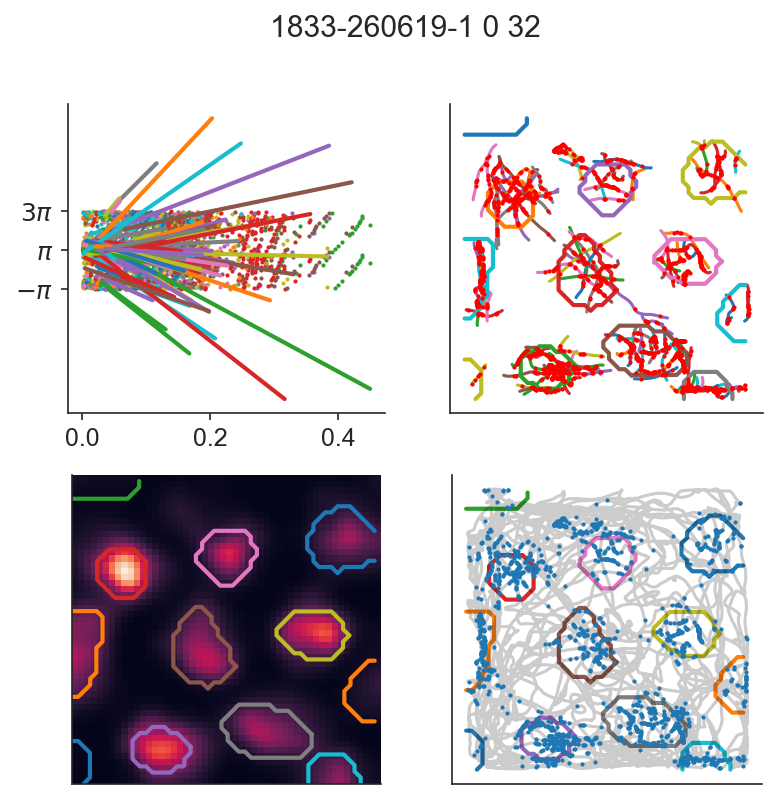

In [37]:
res = compute_phase_precession_runs(
#      data.query('action=="1833-020719-1" and unit_idnum==57').iloc[0], 
    data.query('action=="1833-260619-1" and unit_idnum==32').iloc[0],
     plot='all', save=False, plot_regression_line=True, field_num=None, slope_limit_dist=[-20,20], norm=False, store_runs=True, crossing_type='rate')
res = pd.DataFrame(res)
res

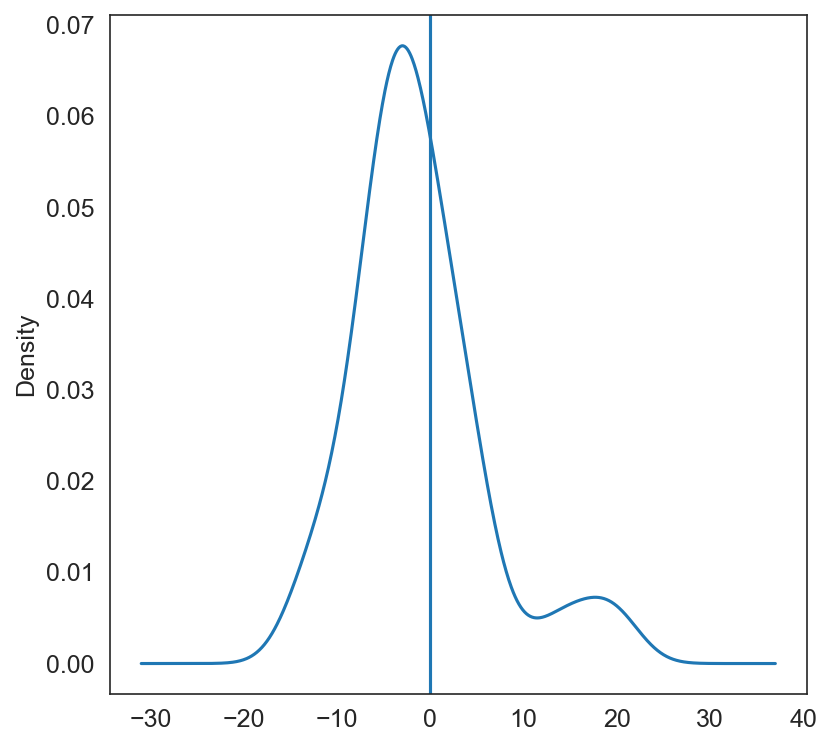

In [38]:
res.slope_dist.plot.density()
# res.slope_dist.hist()
plt.axvline(0)

In [47]:
def compute_phase_precession(row, flim=[6, 10], field_num=None, slope_limit_dist=[-1,1], slope_limit_dur=[-1,1], norm=True, store_runs=False,
                             plot=False, plot_regression_line=True, save=False, dot_size=1, crossing_type='field'):
    '''
    flim : [flow, fhigh]
    field_num : int
        which field to plot
    reg_limit : [low, high]
        Regression intervall
    plot : str
        "all" or "scatter"
    plot_regression_line : bool
        plot the regression line in scatter
    save : bool
        save plot
    dot_size : size of scatter dots
    '''
    spike_phase_func, spikes, pos_x, pos_y, pos_t, rate_map, fields = compute_data(row, flim)
    
    if field_num is not None:
        fields = np.where(fields == field_num, fields, 0)
        
        
    if crossing_type == 'field':
        in_field_indices = which_field(pos_x, pos_y, fields, box_size)
        in_field_enter, in_field_exit = compute_crossings(in_field_indices)
    elif crossing_type == 'rate':
        _, _, in_field_enter, in_field_exit = compute_rate_crossings(spikes, pos_t)

    if plot == 'all':
            fig, axs = plt.subplots(2, 2)
            plt.suptitle(f'{row.action} {row.channel_group} {row.unit_idnum}')
    elif plot == 'scatter':
            fig, ax = plt.subplots(1, 1)
            axs = [[ax]]
            ax.set_title(f'{row.action} {row.channel_group} {row.unit_idnum}')

    in_field_spikes, in_field_dur, in_field_dist, spike_phase = [], [], [], []

    sx, sy = interp1d(pos_t, pos_x), interp1d(pos_t, pos_y)
    results = []
    for en, ex in zip(in_field_enter, in_field_exit):
        x, y, t = pos_x[en:ex+1], pos_y[en:ex+1], pos_t[en:ex+1]
        if len(t) <= 1:
            continue
        s = spikes[(spikes > t[0]) & (spikes < t[-1])]
        if len(s) < 5:
            continue

        in_field_spikes.append(s)
        
        dist = distance(x, y)
        if norm:
            t_to_dist = interp1d(t, normalize(dist))
        else:
            t_to_dist = interp1d(t, dist)
        in_field_dist.append(t_to_dist(s))
        
        if norm:
            t_to_dur = interp1d(t, normalize(t))
        else:
            t_to_dur = interp1d(t, t)
        in_field_dur.append(t_to_dur(s))
        
        spike_phase.append(spike_phase_func(s))
        
        if plot == 'all':
            axs[0][1].plot(x, y)
            axs[0][1].scatter(sx(s), sy(s), s=dot_size, color='r', zorder=100000)
            
    dist = np.array([d for di in in_field_dist for d in di])
    dur = np.array([d for di in in_field_dur for d in di])
    phase = np.array([d for di in spike_phase for d in di])
    
    if len(dist) < 2:
        circ_lin_corr_dist, pval_dist, slope_dist, phi0_dist, RR_dist = [np.nan] * 5
        circ_lin_corr_dur, pval_dur, slope_dur, phi0_dur, RR_dur = [np.nan] * 5
    else:
        circ_lin_corr_dist, pval_dist, slope_dist, phi0_dist, RR_dist = cl_corr(
            dist, phase, *slope_limit_dist, return_pval=True)
        circ_lin_corr_dur, pval_dur, slope_dur, phi0_dur, RR_dur = cl_corr(
            dur, phase, *slope_limit_dur, return_pval=True)
    
    results = {
        'action': row.action, 
        'channel_group': row.channel_group, 
        'unit_name': row.unit_name,
        'group': row.group,
        'unit_idnum': row.unit_idnum,
        'flim': flim,
        'slope_limit_dist': slope_limit_dist,
        'slope_limit_dur': slope_limit_dur,
        'crossing_type': crossing_type,
        'norm': norm,
        'circ_lin_corr_dist': circ_lin_corr_dist, 
        'pval_dist': pval_dist, 
        'slope_dist': slope_dist, 
        'phi0_dist': phi0_dist, 
        'RR_dist': RR_dist,
        'circ_lin_corr_dur': circ_lin_corr_dur, 
        'pval_dur': pval_dur, 
        'slope_dur': slope_dur, 
        'phi0_dur': phi0_dur, 
        'RR_dur': RR_dur
    }
    if store_runs:
        results.update({
            'dist': dist,
            'dur': dur,
            'phase': phase
        })
    if plot:
        plot_spike_phase(dist, phase, dot_size, slope_dist, phi0_dist, circ_lin_corr_dist, pval_dist, RR_dist, plot_regression_line, axs[0][0])
    if plot == 'all':
        plot_spikes_and_rate_map(row, rate_map, fields, pos_x, pos_y, sy, sx, spikes, box_size, bin_size, dot_size, flim, output_path, save, axs)
    
    return results

,action,channel_group,unit_name,group,unit_idnum,flim,slope_limit_dist,slope_limit_dur,crossing_type,norm,...,phi0_dist,RR_dist,circ_lin_corr_dur,pval_dur,slope_dur,phi0_dur,RR_dur,dist,dur,phase
0,1833-260619-1,0,132,baseline_i,32,"[6, 10]","[-20, 20]","[-1, 1]",rate,False,...,3.67106,0.269756,-0.043873,0.076541,-0.61247,5.207154,0.065315,"[0.012147135564937317, 0.051689127799828115, 0...","[22.646533333333334, 22.8028, 22.8194666666666...","[2.1669906523701563, 2.2734681246324353, 2.983..."


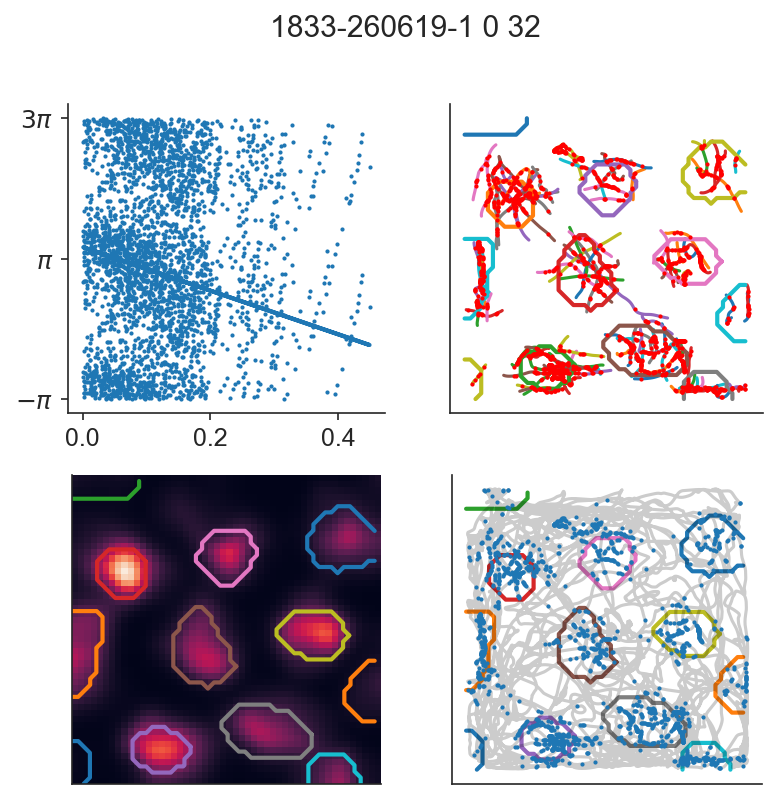

In [40]:
res = compute_phase_precession(
#      data.query('action=="1833-020719-1" and unit_idnum==57').iloc[0], 
     data.query('action=="1833-260619-1" and unit_idnum==32').iloc[0],
     plot='all', save=False, plot_regression_line=True, slope_limit_dist=[-20,20], norm=False, store_runs=True, crossing_type='rate')
pd.DataFrame([res])

,action,channel_group,unit_name,group,unit_idnum,flim,slope_limit_dist,slope_limit_dur,crossing_type,norm,...,phi0_dist,RR_dist,circ_lin_corr_dur,pval_dur,slope_dur,phi0_dur,RR_dur,dist,dur,phase
0,1833-260619-1,0,132,baseline_i,32,"[6, 10]","[-1, 1]","[-1, 1]",rate,True,...,4.183214,0.271241,-0.257396,0.0,-0.510794,4.105743,0.268559,"[0.08780753546252604, 0.373643226260797, 0.399...","[0.066652418735785, 0.20743319951656636, 0.222...","[2.1669906523701563, 2.2734681246324353, 2.983..."


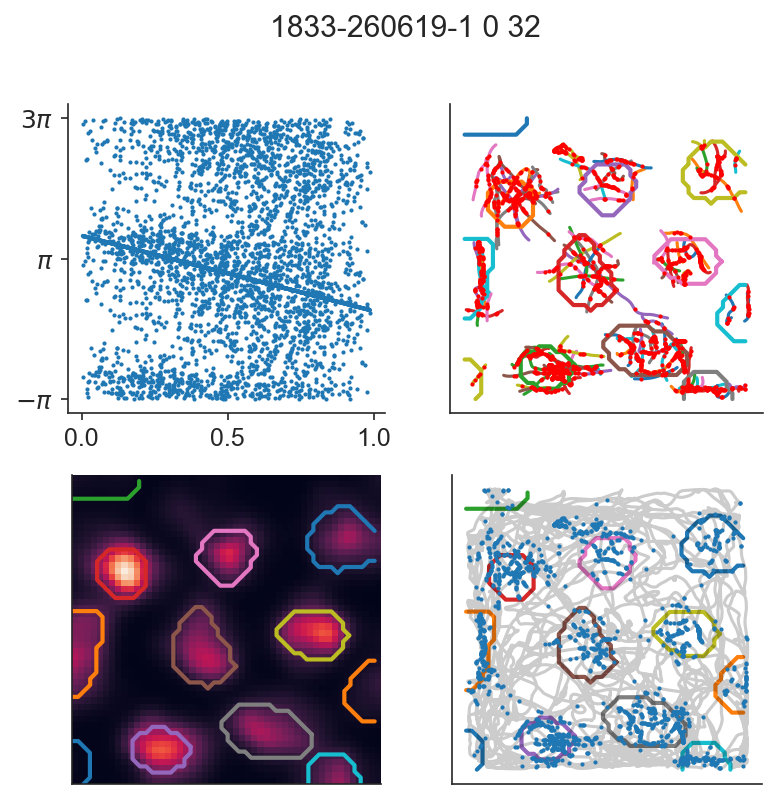

In [41]:
res = compute_phase_precession(
#      data.query('action=="1833-020719-1" and unit_idnum==57').iloc[0], 
     data.query('action=="1833-260619-1" and unit_idnum==32').iloc[0],
     plot='all', save=False, plot_regression_line=True, slope_limit_dist=[-1,1], norm=True, store_runs=True, crossing_type='rate')
pd.DataFrame([res])

# Analysis

In [42]:
# results_runs = data.parallel_apply(
#     compute_phase_precession_runs, 
#     axis=1, 
#     slope_limit_dist=[-20, 20], 
#     slope_limit_dur=[-5, 5], 
#     flim=[6,10],
#     norm=False, 
#     store_runs=True, 
#     crossing_type='field'
# )
# results_runs = pd.DataFrame([b for a in results_runs for b in a])

In [ ]:
# results_runs_11 = data.parallel_apply(
#     compute_phase_precession, 
#     flim=[10,12], 
#     axis=1, 
#     slope_limit_dist=[-20, 20], 
#     slope_limit_dur=[-5, 5], 
#     norm=False, 
#     store_runs=True, 
#     crossing_type='field'
# )
# results_runs_11 = pd.DataFrame([b for a in results_runs_11 for b in a])

In [ ]:
# results_runs_30 = data.parallel_apply(
#     compute_phase_precession, 
#     flim=[29,31], 
#     axis=1, 
#     slope_limit_dist=[-20, 20], 
#     slope_limit_dur=[-5, 5], 
#     norm=False, 
#     store_runs=True, 
#     crossing_type='field'
# )
# results_runs_30 = pd.DataFrame([b for a in results_runs_30 for b in a])

In [ ]:
# results_runs = pd.concat([results_runs, results_runs_11, results_runs_30])

In [ ]:
# results_runs['flim_str'] = results_runs.apply(lambda x: '_'.join(str(a) for a in x.flim), axis=1)

In [ ]:
# plt.scatter(results_runs.circ_lin_corr_dist, results_runs.circ_lin_corr_dur, s=1)

In [ ]:
# plt.figure(figsize=(4,4))
# for i, d in results_runs.groupby('group'):
#     s = d.query('flim_str=="6_10"').slope_dist
#     s.plot.density(label=i)
# #     s.hist(label=i, bins=50, histtype='step')
    

# # results_runs.query('flim_str=="10_12"').slope_dist.plot.density(label='f10-12')
# # results_runs.query('flim_str=="29_31"').slope_dist.plot.density(label='f29-31')    

# plt.axvline(0, c='grey', lw=1)
# # plt.xlim(-60,60)
    
# plt.legend()

In [ ]:
# plt.figure(figsize=(4,4))
# for i, d in results_runs.groupby('group'):
# #     q_sig = 'pval_dist < 0.01 and RR_dist > .1'
# #     q_sig = 'RR_dist > .1'
#     q_sig = ''
#     q = 'flim_str=="6_10"'
# #     q = 'flim_str=="6_10"'
#     s = d.query(q + q_sig).circ_lin_corr_dist
#     s.plot.density(label=i)
# #     s.hist(label=i, bins=50, histtype='step')
# # results_runs.query('flim_str=="10_12"' + q_sig).circ_lin_corr_dist.plot.density(label='f10-12')
# # results_runs.query('flim_str=="29_31"' + q_sig).circ_lin_corr_dist.plot.density(label='f29-31')

# plt.axvline(0, c='grey', lw=1)
# plt.xlim(-1,1)
# plt.legend()

# Aggregated runs

In [48]:
results_norm = data.parallel_apply(
    compute_phase_precession, 
    axis=1, 
    result_type='expand', 
    slope_limit_dist=[-2, 2], 
    slope_limit_dur=[-2, 2], 
    crossing_type='rate',
    store_runs=False,
    norm=True
)

In [49]:
results = data.parallel_apply(
    compute_phase_precession, 
    axis=1, 
    result_type='expand', 
    slope_limit_dist=[-20, 20], 
    slope_limit_dur=[-5, 5], 
    crossing_type='rate',
    store_runs=False,
    norm=False
)

In [50]:
# results_11 = data.parallel_apply(
#     compute_phase_precession, 
#     return_runs=False, 
#     flim=[10,12], 
#     axis=1, 
#     result_type='expand',
#     slope_limit_dist=[-2, 2], 
#     slope_limit_dur=[-2, 2], 
#     crossing_type='field'
# )

In [51]:
# results_30 = data.parallel_apply(
#     compute_phase_precession, 
#     return_runs=False, 
#     flim=[29,31], 
#     axis=1, 
#     result_type='expand',
#     slope_limit_dist=[-2, 2], 
#     slope_limit_dur=[-2, 2], 
#     crossing_type='field'
# )

In [63]:
# results = pd.concat([results, results_11, results_30])
results = pd.concat([results, results_norm])

/home/mikkel/.virtualenvs/expipe/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  


In [64]:
results['flim_str'] = results.apply(lambda x: '_'.join(str(a) for a in x.flim), axis=1)

('stim_11', False) empty
('stim_11', True) empty
('stim_30', False) empty
('stim_30', True) empty


/home/mikkel/.virtualenvs/expipe/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: Interpreting tuple 'by' as a list of keys, rather than a single key. Use 'by=[...]' instead of 'by=(...)'. In the future, a tuple will always mean a single key.
  


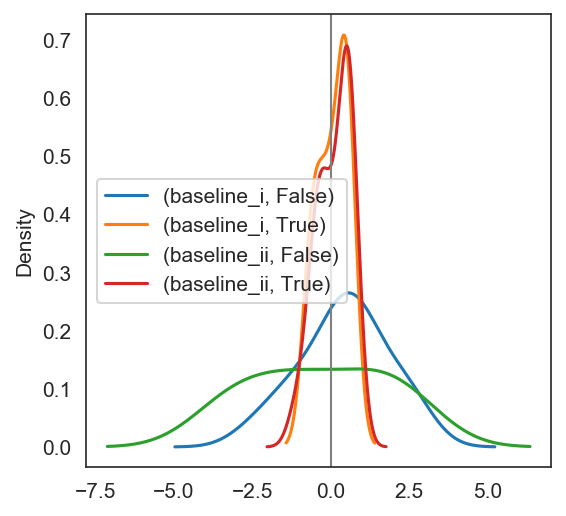

In [65]:
plt.figure(figsize=(4,4))
for i, d in results.groupby(('group', 'norm')):
    q_sig = ' and pval_dist < 0.01 and RR_dist > .1'
#     q_sig = ''
    q = 'flim_str=="6_10"' + q_sig
    if len(d.query(q)) < 2:
        print(i, 'empty')
        continue
    d.query(q).slope_dist.plot.density(label=i)
#     d.query(q).circ_lin_corr_dist.hist(label=i, bins=50, histtype='step')

# results.query('flim_str=="10_12"').slope_dist.plot.density(label='f10-12')
# results.query('flim_str=="29_31"').slope_dist.plot.density(label='f29-31')

plt.axvline(0, c='grey', lw=1)
# plt.xlim(-2,2)
plt.legend()

In [66]:
# results['entity'] = results.apply(lambda x: x.action.split('-')[0], axis=1)

stim_30 empty


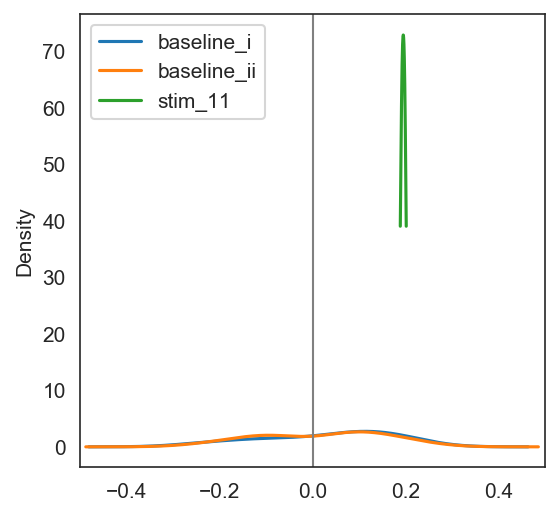

In [67]:
plt.figure(figsize=(4,4))
# for i, d in results.groupby(('group', 'entity')):
for i, d in results.groupby('group'):
#     if i[0] != 'baseline_i':
#         continue
    q_sig = ' and pval_dist < 0.01 and RR_dist > .1'
    q = 'flim_str=="6_10"' + q_sig
    if len(d.query(q)) < 2:
        print(i, 'empty')
        continue
    s = d.query(q).circ_lin_corr_dist
#     try:
    s.plot.density(label=i)
#         s.hist(label=i, bins=50, histtype='step')
#     except:
#         pass

# results.query('flim_str=="10_12"').circ_lin_corr_dist.plot.density(label='f10-12')
# results.query('flim_str=="29_31"').circ_lin_corr_dist.plot.density(label='f29-31')

plt.axvline(0, c='grey', lw=1)
plt.xlim(-.5,.5)
plt.legend()

In [68]:
# results.reset_index(drop=True).to_feather(output_path / 'results.feather')

In [89]:
results['pRR_dist'] = results.apply(lambda x: x.pval_dist / x.RR_dist, axis=1)

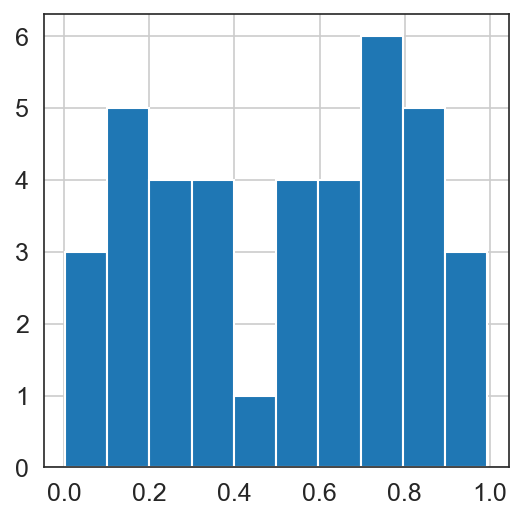

In [100]:
results.query('group=="stim_30" and norm').circ_lin_corr_dist.plot.density()

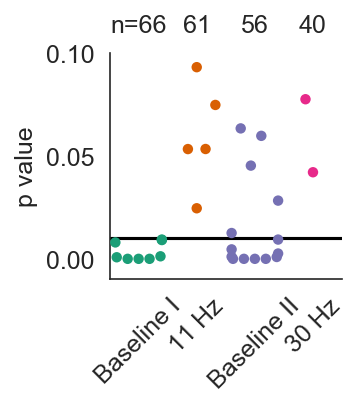

In [117]:
plt.rc('axes', titlesize=12)
plt.rcParams.update({
    'font.size': 12, 
    'figure.figsize': (2, 2), 
    'figure.dpi': 150,
    'font.size': 12,
})
fig = plt.figure()
palette = sns.color_palette(['#1b9e77','#d95f02','#7570b3','#e7298a'])
sns.set_palette(palette)
sns.swarmplot(
    x="group", 
    y="pval_dist", 
    data=results.query('flim_str=="6_10" and norm and circ_lin_corr_dist < 0'), 
    order=['baseline_i', 'stim_11', 'baseline_ii', 'stim_30']
)
sns.despine()
plt.ylim(-.01,.1)
plt.axhline(0.01, color='k', label='p = 0.01')
plt.xlabel('')
plt.ylabel('p value')
plt.xticks(range(4), ['Baseline I', '11 Hz', 'Baseline II', '30 Hz'], rotation=45)
# plt.legend(frameon=False)

number_of_cells = {}
for i, d in results.query(q).groupby('group'):
    number_of_cells[i] = len(d)
    
for i, k in enumerate(['baseline_i', 'stim_11', 'baseline_ii', 'stim_30']):
    t = f'n={number_of_cells[k]}' if i==0 else f'{number_of_cells[k]}'
    plt.text(i, .11, t, horizontalalignment='center')
    
figname = f'phase-precession-quantification-swarm-rate'
fig.savefig(
    output_path / 'figures' / f'{figname}.png', 
    bbox_inches='tight', transparent=True)
fig.savefig(
    output_path / 'figures' / f'{figname}.svg', 
    bbox_inches='tight', transparent=True)

# barplot

In [106]:
plt.rc('axes', titlesize=12)
plt.rcParams.update({
    'font.size': 12, 
    'figure.figsize': (3, 3), 
    'figure.dpi': 150,
    'font.size': 10,
})

In [107]:
q_sig = 'pval_dist < 0.01 and RR_dist > .1'
q = 'flim_str=="6_10" and not norm'

percentages = {}
for i, d in results.query(q).groupby('group'):
    percentages[i] = {
        'precess': sum(d.query(q_sig).circ_lin_corr_dist < 0) / len(d) * 100,
        'recess': sum(d.query(q_sig).circ_lin_corr_dist > 0) / len(d) * 100,
        'n': len(d)
    }

In [108]:
percentages

{'baseline_i': {'precess': 7.575757575757576,
  'recess': 18.181818181818183,
  'n': 66},
 'baseline_ii': {'precess': 12.5, 'recess': 16.071428571428573, 'n': 56},
 'stim_11': {'precess': 0.0, 'recess': 1.639344262295082, 'n': 61},
 'stim_30': {'precess': 0.0, 'recess': 0.0, 'n': 40}}

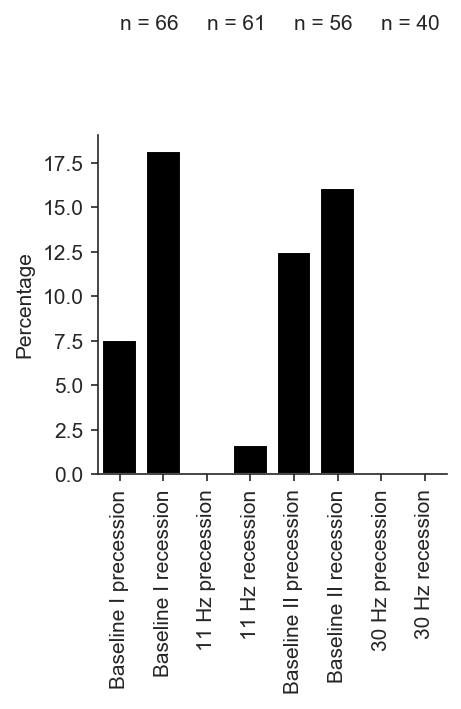

In [109]:
fig = plt.figure()
sns.barplot(data=[
    [percentages['baseline_i']['precess']], 
    [percentages['baseline_i']['recess']],
    [percentages['stim_11']['precess']], 
    [percentages['stim_11']['recess']],
    [percentages['baseline_ii']['precess']], 
    [percentages['baseline_ii']['recess']],
    [percentages['stim_30']['precess']], 
    [percentages['stim_30']['recess']],
], color='k')
plt.xticks(
    range(8),
    [
        'Baseline I precession', 
        'Baseline I recession', 
        '11 Hz precession',
        '11 Hz recession',
        'Baseline II precession', 
        'Baseline II recession', 
        '30 Hz precession',
        '30 Hz recession'
    ], rotation=90)
plt.ylabel('Percentage')

_y = 25
plt.text(0, _y, f'n = {percentages["baseline_i"]["n"]}')
plt.text(2, _y, f'n = {percentages["stim_11"]["n"]}')
plt.text(4, _y, f'n = {percentages["baseline_ii"]["n"]}')
plt.text(6, _y, f'n = {percentages["stim_30"]["n"]}')
despine()
figname = f'phase-precession-quantification-rate'
fig.savefig(
    output_path / 'figures' / f'{figname}.png', 
    bbox_inches='tight', transparent=True)
fig.savefig(
    output_path / 'figures' / f'{figname}.svg', 
    bbox_inches='tight', transparent=True)

# evaluate single cells

In [54]:
plt.rc('axes', titlesize=12)
plt.rcParams.update({
    'font.size': 12, 
    'figure.figsize': (2, 2), 
    'figure.dpi': 150
})

In [35]:
plt.rc('axes', titlesize=12)
plt.rcParams.update({
    'font.size': 12, 
    'figure.figsize': (6, 6), 
    'figure.dpi': 150
})

ValueError: The length of x is too small: len(x) < 2.

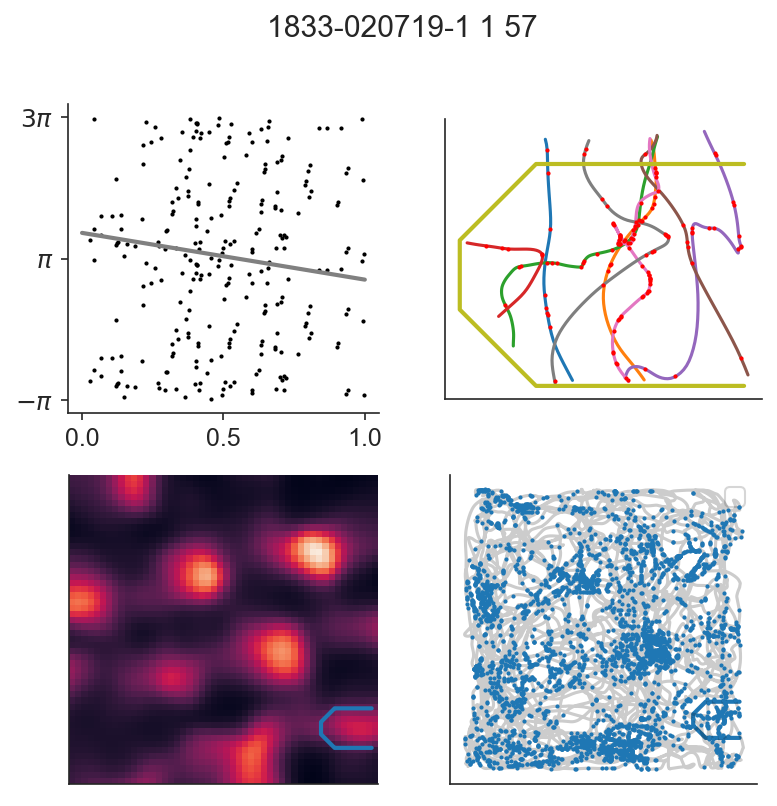

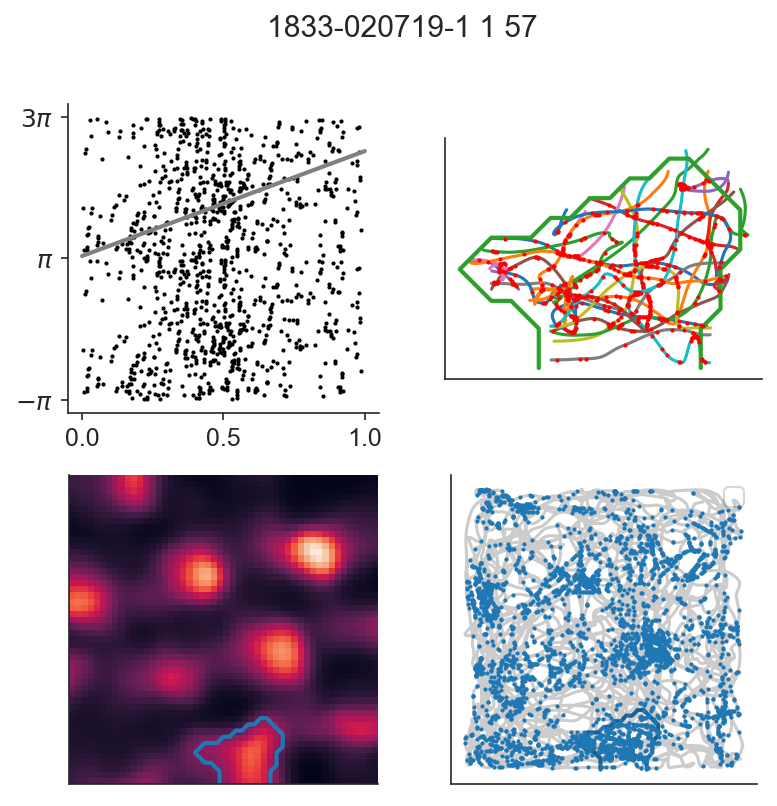

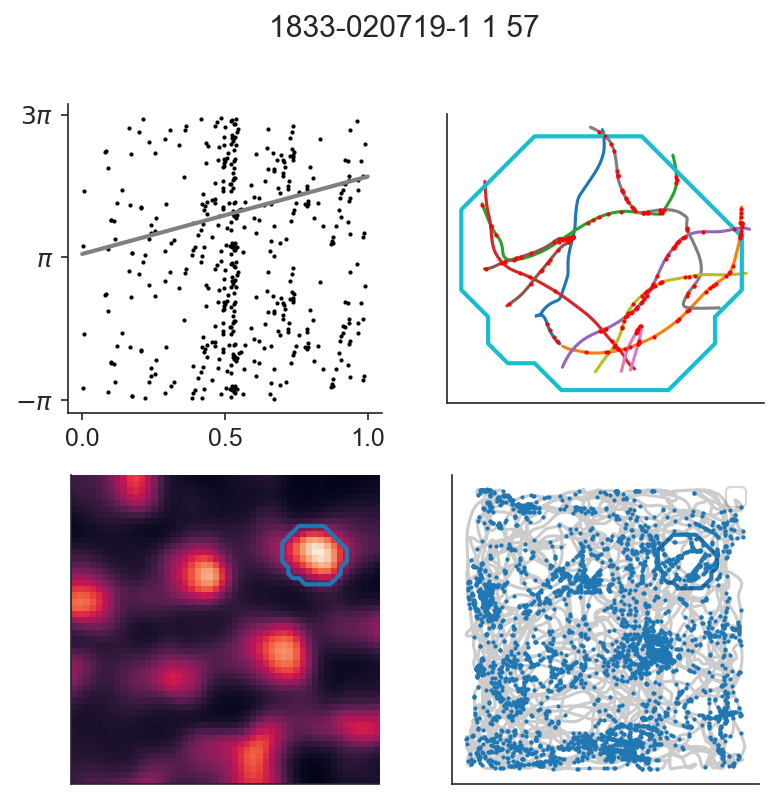

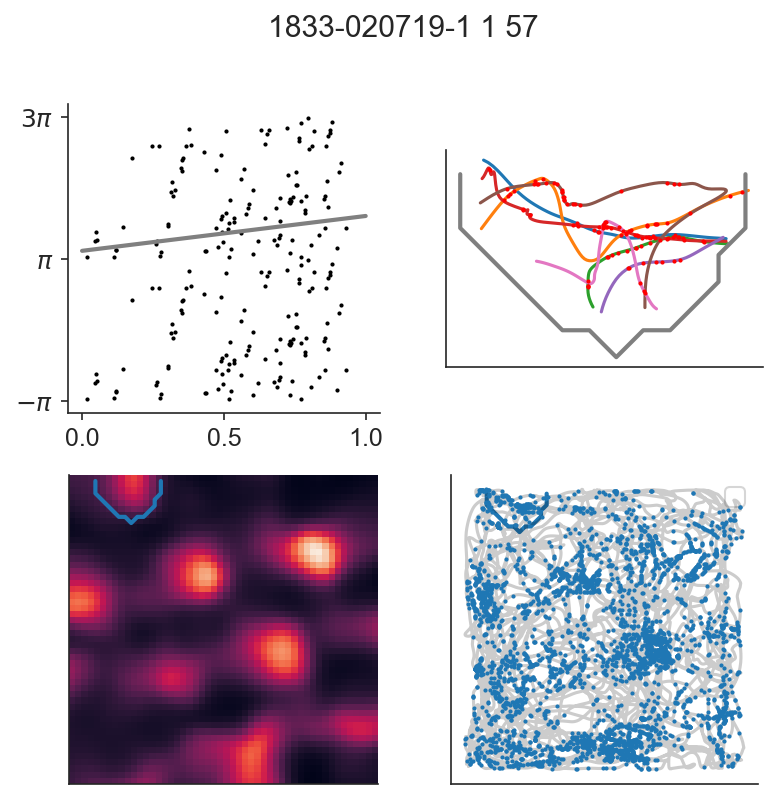

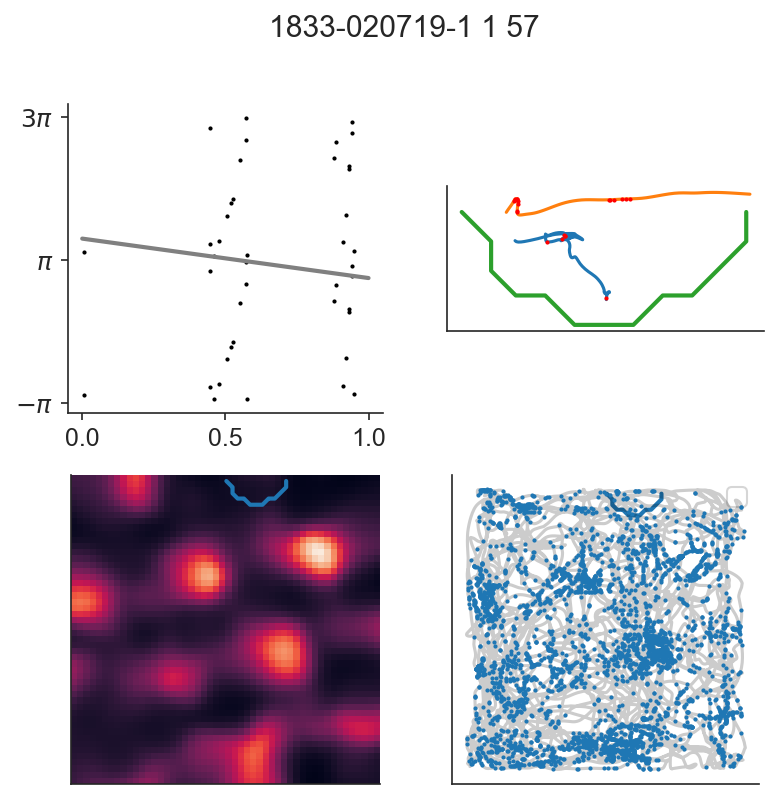

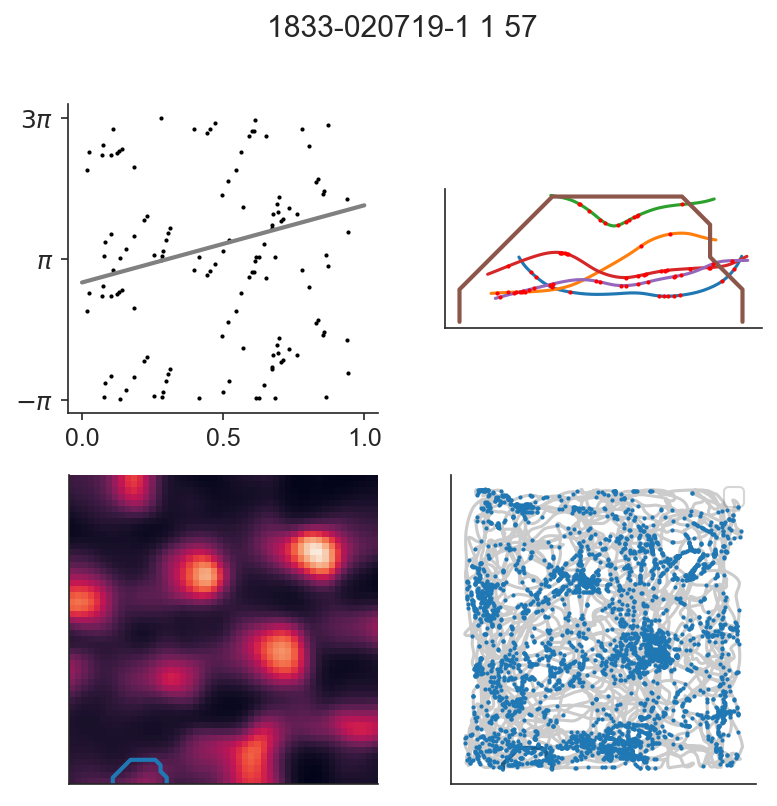

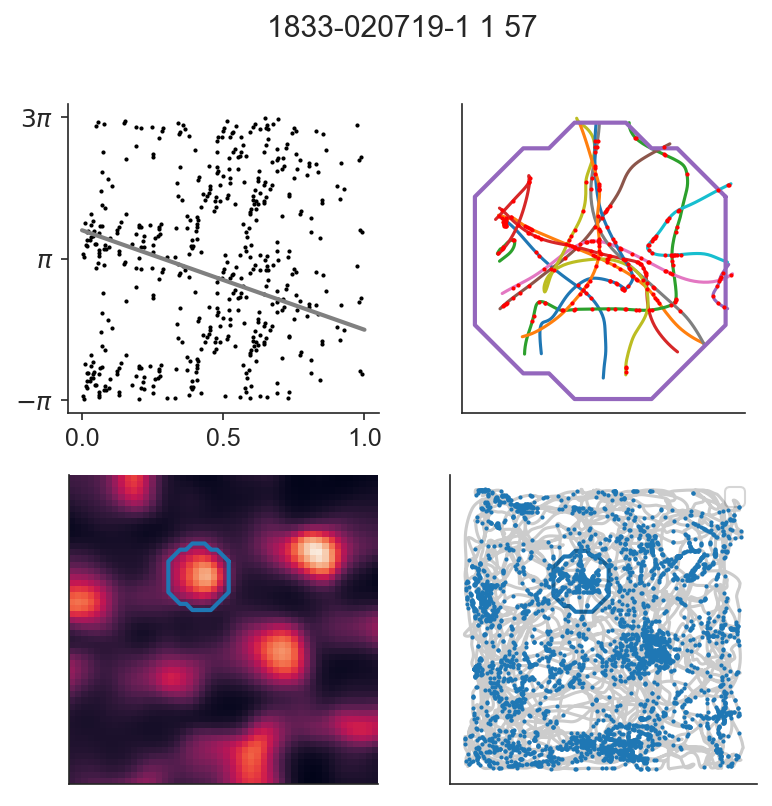

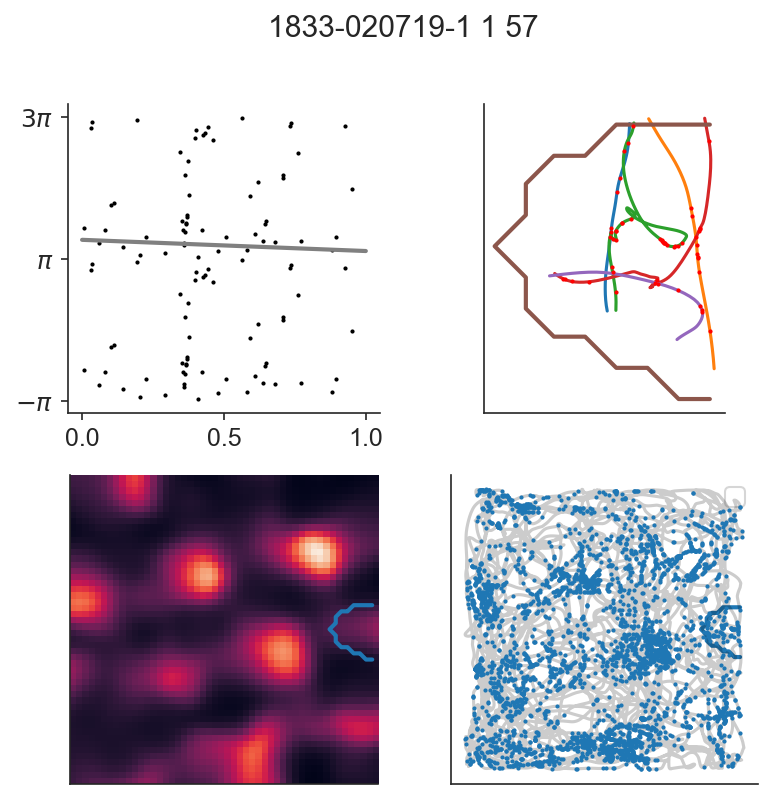

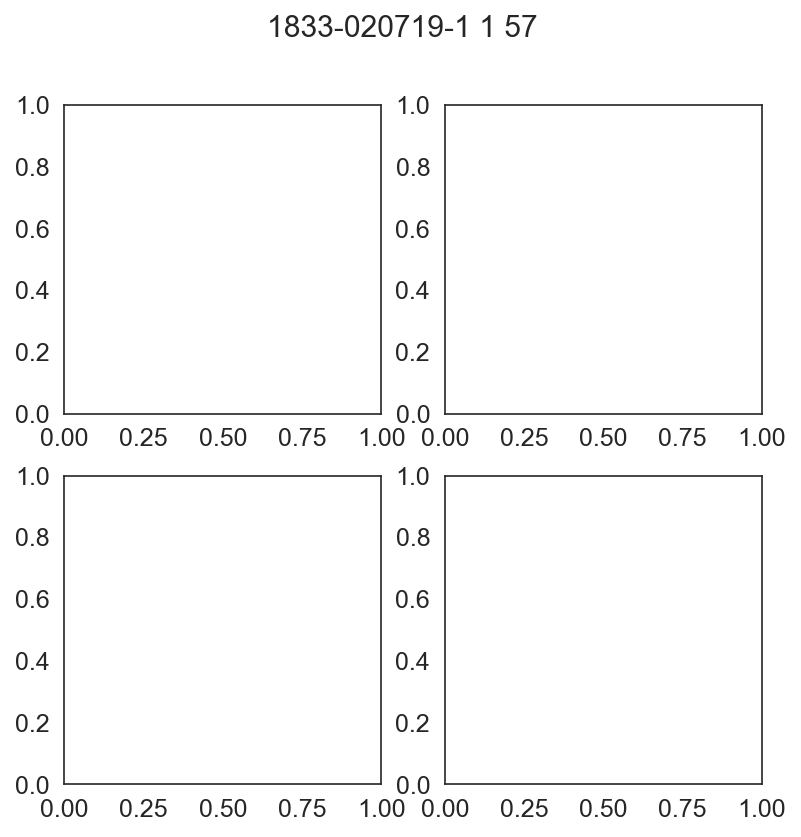

In [197]:
for fn in range(1, 10):
    compute_phase_precession(
         data.query('action=="1833-020719-1" and unit_idnum==57').iloc[0], 
         plot=True, save=False, plot_grid=True, field_num=fn);

{'action': '1833-260619-2',
 'channel_group': 0,
 'unit_name': 174,
 'circ_lin_corr_dist': 0.015035045939466871,
 'pval_dist': 0.58032151303154,
 'slope_dist': 0.31943787776044974,
 'phi0_dist': 4.843627836303633,
 'RR_dist': 0.03720602786152166,
 'circ_lin_corr_dur': 0.008726766011604742,
 'pval_dur': 0.7501129594935525,
 'slope_dur': 0.12178247278219806,
 'phi0_dur': 5.408259850880937,
 'RR_dur': 0.034326500937119704}

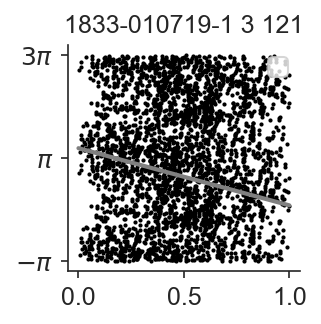

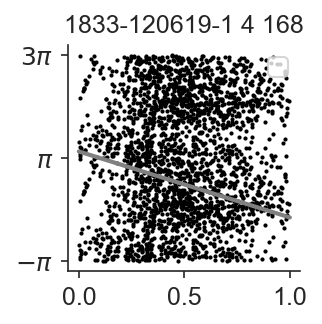

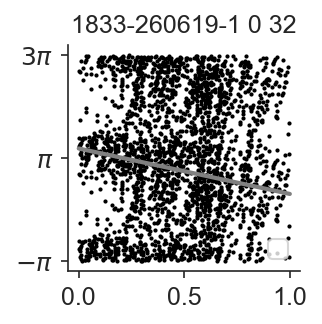

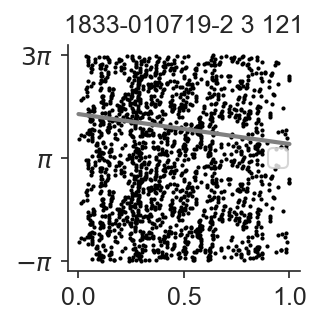

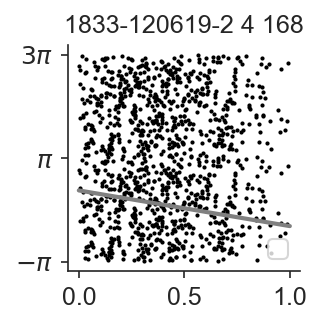

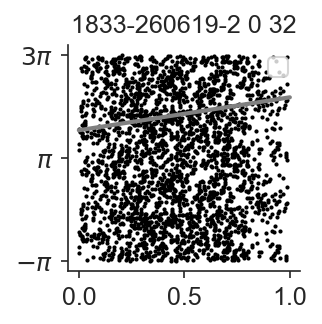

In [43]:
compute_phase_precession(
     data.query('action=="1833-010719-1" and unit_idnum==121').iloc[0], 
     plot=True, save=True, plot_lines=True)
compute_phase_precession(
     data.query('action=="1833-120619-1" and unit_idnum==168').iloc[0], 
     plot=True, save=True, plot_lines=True)
compute_phase_precession(
     data.query('action=="1833-260619-1" and unit_idnum==32').iloc[0], 
     plot=True, save=True, plot_lines=True)
compute_phase_precession(
     data.query('action=="1833-010719-2" and unit_idnum==121').iloc[0], 
     plot=True, save=True, plot_lines=True)
compute_phase_precession(
     data.query('action=="1833-120619-2" and unit_idnum==168').iloc[0], 
     plot=True, save=True, plot_lines=True)
compute_phase_precession(
     data.query('action=="1833-260619-2" and unit_idnum==32').iloc[0], 
     plot=True, save=True, plot_lines=True)

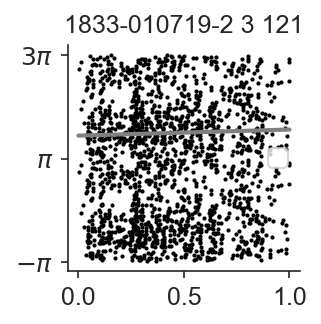

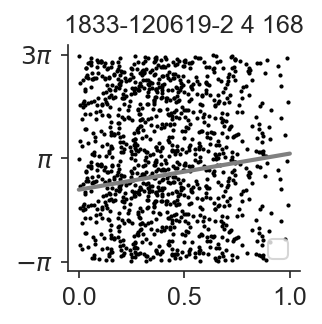

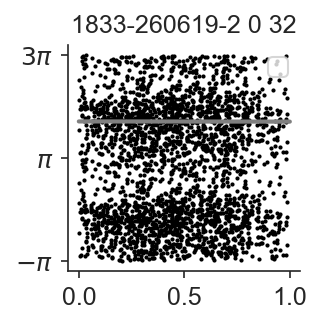

In [44]:
compute_phase_precession(
     data.query('action=="1833-010719-2" and unit_idnum==121').iloc[0], 
     plot=True, save=True, flim=[10,12], plot_lines=True)
compute_phase_precession(
     data.query('action=="1833-120619-2" and unit_idnum==168').iloc[0], 
     plot=True, save=True, flim=[10,12], plot_lines=True)
compute_phase_precession(
     data.query('action=="1833-260619-2" and unit_idnum==32').iloc[0], 
     plot=True, save=True, flim=[10,12], plot_lines=True);

# evaluate all cells

In [ ]:
plt.rc('axes', titlesize=12)
plt.rcParams.update({
    'font.size': 12, 
    'figure.figsize': (6, 6), 
    'figure.dpi': 150
})

/home/mikkel/.virtualenvs/expipe/lib/python3.6/site-packages/ipykernel_launcher.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


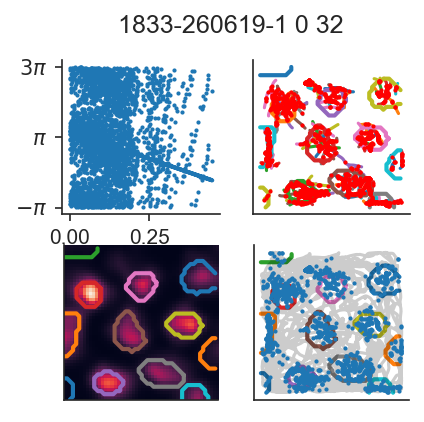

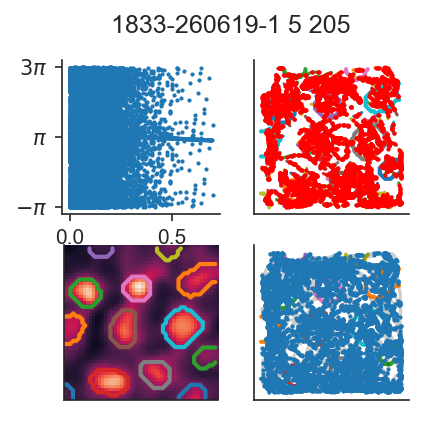

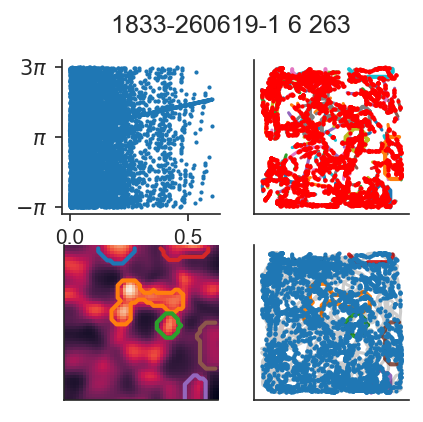

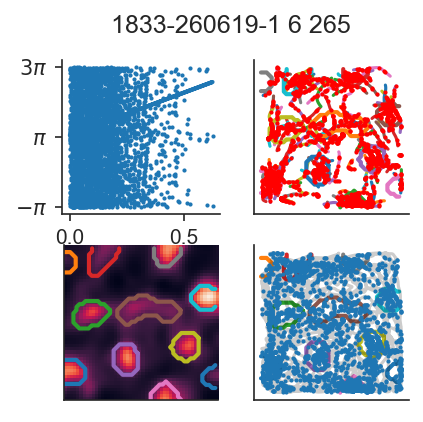

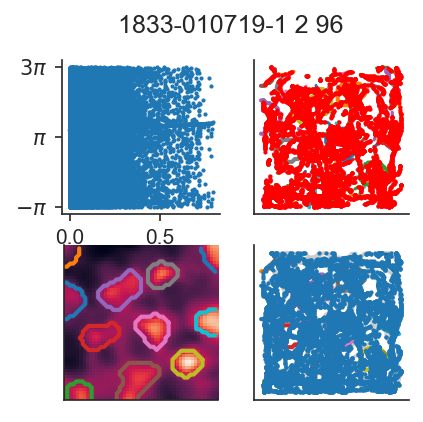

...

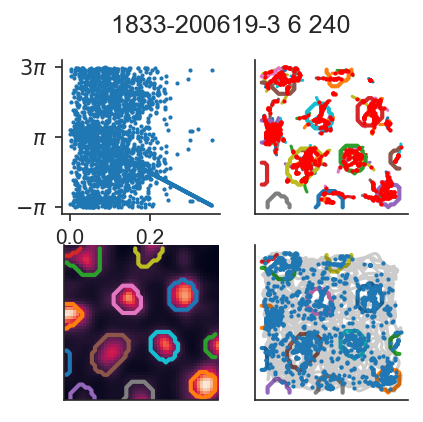

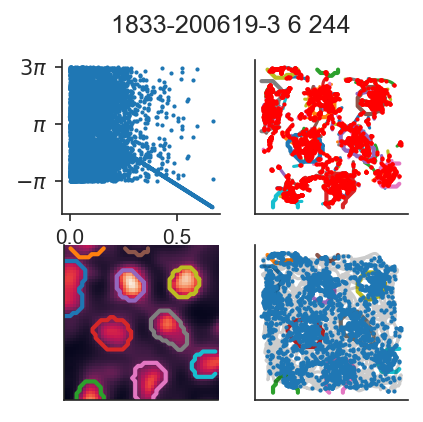

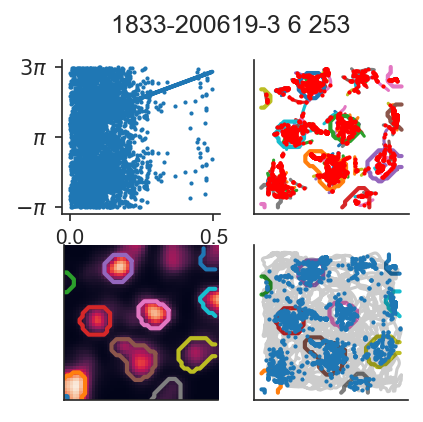

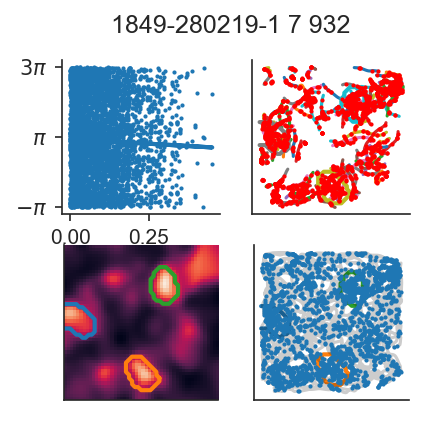

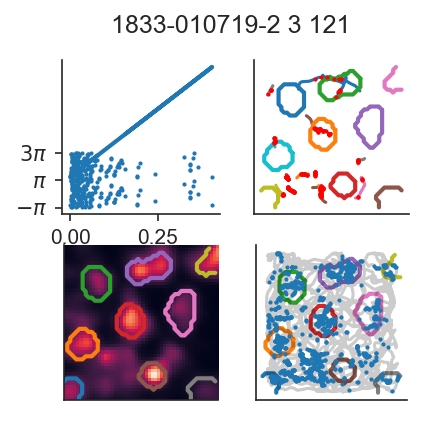

In [82]:
for row in results.query('pval_dist < 0.01 and RR_dist > .1').itertuples():
    compute_phase_precession(
        row, plot='all', 
        flim=[6,10], 
        slope_limit_dist=[-20, 20], 
        slope_limit_dur=[-5, 5], 
        crossing_type='rate',
        norm=False
    )

# Save to expipe

In [480]:
action = project.require_action("phase-precession")

[autoreload of scipy.stats.stats failed: Traceback (most recent call last):
  File "/home/mikkel/.virtualenvs/expipe/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 244, in check
    superreload(m, reload, self.old_objects)
  File "/home/mikkel/.virtualenvs/expipe/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 378, in superreload
    module = reload(module)
  File "/home/mikkel/.virtualenvs/expipe/lib/python3.6/imp.py", line 315, in reload
    return importlib.reload(module)
  File "/home/mikkel/.virtualenvs/expipe/lib/python3.6/importlib/__init__.py", line 166, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 618, in _exec
  File "<frozen importlib._bootstrap_external>", line 678, in exec_module
  File "<frozen importlib._bootstrap>", line 219, in _call_with_frames_removed
  File "/home/mikkel/.virtualenvs/expipe/lib/python3.6/site-packages/scipy/stats/stats.py", line 180, in <module>
    import scipy.sp

In [481]:
copy_tree(output_path, str(action.data_path()))

['/media/storage/expipe/septum-mec/actions/phase-precession/data/results.feather',
 '/media/storage/expipe/septum-mec/actions/phase-precession/data/figures/1833-120619-2 4 168.svg',
 '/media/storage/expipe/septum-mec/actions/phase-precession/data/figures/1833-260619-2_0_32_f10-12.png',
 '/media/storage/expipe/septum-mec/actions/phase-precession/data/figures/1833-260619-2_0_32_f6-10.png',
 '/media/storage/expipe/septum-mec/actions/phase-precession/data/figures/phase-precession-quantification.svg',
 '/media/storage/expipe/septum-mec/actions/phase-precession/data/figures/1833-010719-1 3 121.svg',
 '/media/storage/expipe/septum-mec/actions/phase-precession/data/figures/1833-120619-2_4_168_f10-12.png',
 '/media/storage/expipe/septum-mec/actions/phase-precession/data/figures/1833-010719-2 3 121.png',
 '/media/storage/expipe/septum-mec/actions/phase-precession/data/figures/1833-120619-2_4_168_f10-12.svg',
 '/media/storage/expipe/septum-mec/actions/phase-precession/data/figures/1833-010719-1 3

In [482]:
septum_mec.analysis.registration.store_notebook(action, "20_phase-precession.ipynb")

# The inverted grid

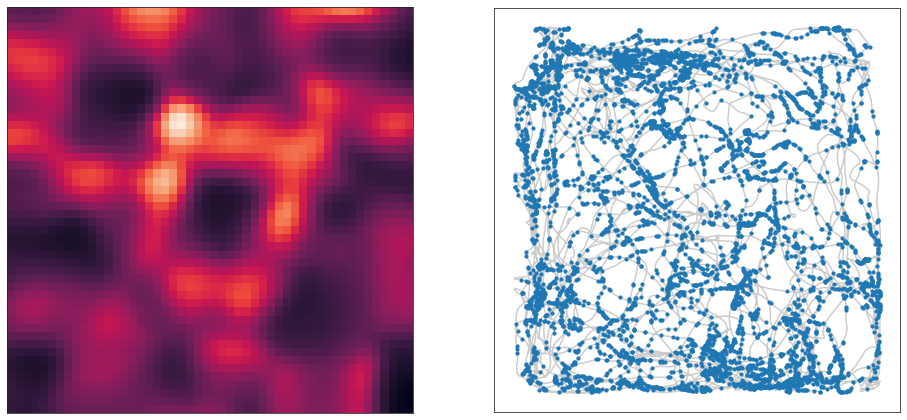

In [31]:
fig, axs = plt.subplots(1, 2, figsize=(16,9))
row = baseline_i.sort_values('gridness', ascending=False).iloc[9]
lfp = data_loader.lfp(row.action, row.channel_group)
spikes = data_loader.spike_train(row.action, row.channel_group, row.unit_name)
rate_map = data_loader.rate_map(row.action, row.channel_group, row.unit_name, smoothing=0.04)
pos_x, pos_y, pos_t, pos_speed = map(data_loader.tracking(row.action).get, ['x', 'y', 't', 'v'])
spikes = np.array(spikes)
spikes = spikes[(spikes > pos_t.min()) & (spikes < pos_t.max())]

axs[0].imshow(rate_map.T, extent=[0, box_size[0], 0, box_size[1]], origin='lower')
axs[1].plot(pos_x, pos_y, color='k', alpha=.2, zorder=1000)
axs[1].scatter(interp1d(pos_t, pos_x)(spikes), interp1d(pos_t, pos_y)(spikes), s=10, zorder=10001)

for ax in axs:
    ax.axis('image')
    ax.set_xticks([])
    ax.set_yticks([])
